<a href="https://colab.research.google.com/github/Avinash-Jha-19/TensorFlow/blob/master/Insurance_Cross_Sell_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Health Insurance Cross Sell Prediction



##### **Project Type**    - Classification
##### **Team Member 1 -** Avinash Jha

# **Project Summary -**

Our client is an Insurance company that has provided Health Insurance to its customers now they need your help in building a model to predict whether the policyholders (customers) from past year will also be interested in Vehicle Insurance provided by the company. An insurance policy is an arrangement by which a company undertakes to provide a guarantee of compensation for specified loss, damage, illness, or death in return for the payment of a specified premium. A premium is a sum of money that the customer needs to pay regularly to an insurance company for this guarantee. For example, you may pay a premium of Rs. 5000 each year for a health insurance cover of Rs. 200,000/- so that if, God forbid, you fall ill and need to be hospitalized in that year, the
insurance provider company will bear the cost of hospitalization etc. for up to Rs. 200,000. Now if you are wondering how can company bear such high hospitalization cost when it charges a premium of only Rs. 5000/-, that is where the concept of probabilities comes in picture. For example, like you, there may be 100 customers who would be paying a premium of Rs. 5000 every year, but only a few of them (say 2-3) would get hospitalized that year and not everyone. This way everyone shares the risk of everyone else. Just like medical insurance, there is vehicle insurance where every year customer needs to pay a premium of certain amount to insurance provider company so that in case of unfortunate accident by the vehicle, the insurance provider company will provide a compensation (called 'sum assured') to the customer. Building a model to predict whether a customer would be interested in Vehicle Insurance is extremely helpful for the company because it can then accordingly plan its communication strategy to reach out to those customers
and optimize its business model and revenue. Now, in order to predict, whether the customer would be interested in Vehicle insurance, you have information about demographics (gender, age, region code type), Vehicles (Vehicle Age, Damage), Policy (Premium, sourcing channel) etc.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


**Write Problem Statement Here.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from yellowbrick.classifier import ConfusionMatrix
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, RobustScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Datasets/HealthInsuranceCrossSellPrediction.csv')

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [ ]:
df.tail()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0
381108,381109,Male,46,1,29.0,0,1-2 Year,No,41777.0,26.0,237,0


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df.shape

(381109, 12)

### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
len(df[df.duplicated()])

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df.isnull().sum().sort_values(ascending = False)

id                      0
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

<Axes: >

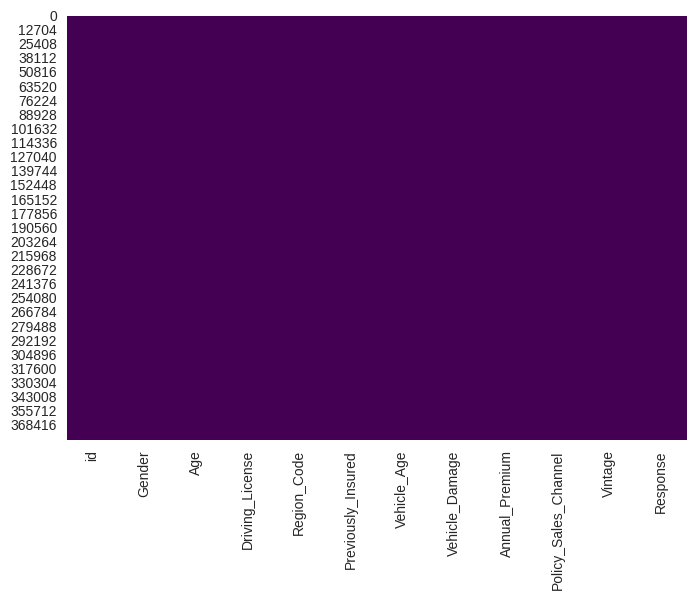

In [ ]:
# Visualizing the missing values
sns.heatmap(df.isnull(),cbar = False, cmap = 'viridis')

### What did you know about your dataset?

**Observations**
- This dataset consists of 381109 rows & 12 columns.
- There are no Duplcate and Null/Missing values.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


### Variables Description

**id**: Unique ID for the customer

**Gender**: Gender of the customer

**Age**: Age of the customer

**Driving_License** 0 : Customer does not have DL, 1 : Customer already has DL

**Region_Code**: Unique code for the region of the customer

**Previously_Insured** 1 : Customer already has Vehicle Insurance, 0 : Customer doesn't have Vehicle Insurance

**Vehicle_Age**: Age of the Vehicle

**Vehicle_Damage** 1: Customer got his/her vehicle damaged in the past. 0 : Customer didn't get his/her vehicle damaged in the past.

**Annual_Premium**: The amount customer needs to pay as premium in the year

**PolicySalesChannel**: Anonymized Code for the channel of outreaching to the customer i.e., Different Agents, Over Mail, Over Phone, In Person, etc.

**Vintage**: Number of Days, Customer has been associated with the company

**Response** 1: Customer is interested, 0 : Customer is not interested

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in df.columns.tolist():
  print(f"The number of Unique values in {i} are {df[i].nunique()}.")

The number of Unique values in id are 381109.
The number of Unique values in Gender are 2.
The number of Unique values in Age are 66.
The number of Unique values in Driving_License are 2.
The number of Unique values in Region_Code are 53.
The number of Unique values in Previously_Insured are 2.
The number of Unique values in Vehicle_Age are 3.
The number of Unique values in Vehicle_Damage are 2.
The number of Unique values in Annual_Premium are 48838.
The number of Unique values in Policy_Sales_Channel are 155.
The number of Unique values in Vintage are 290.
The number of Unique values in Response are 2.


## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.
# Creating a copy of the data frame
insurance_df = df.copy()

### EDA

Text(0.5, 1.0, 'Distribution of Region Code')

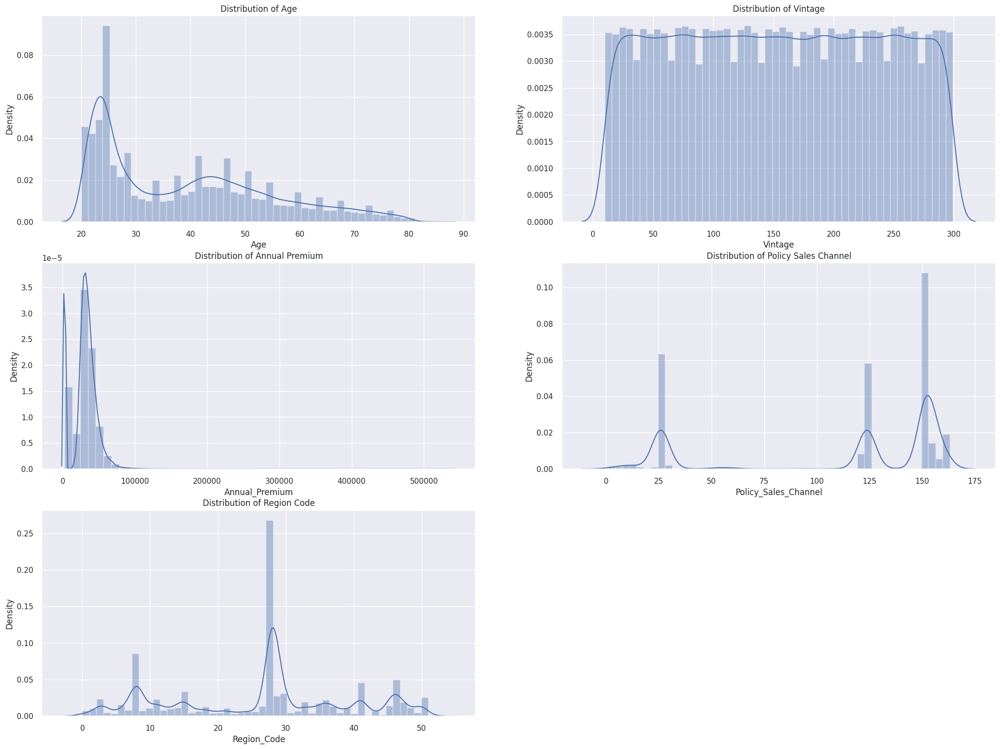

In [ ]:
plt.figure(figsize = (25,25))
sns.set(color_codes = True)

# What is the distribution of the 'Age' of customers?
plt.subplot(4,2,1)
sns.distplot(df['Age'], kde = True)
plt.title("Distribution of Age")

# What is the distribution of 'Vintage' (number of days associated with the company)?
plt.subplot(4,2,2)
sns.distplot(df['Vintage'], kde = True)
plt.title("Distribution of Vintage")

# How is the 'Annual_Premium' distributed?
plt.subplot(4,2,3)
sns.distplot(df['Annual_Premium'], kde = True)
plt.title("Distribution of Annual Premium")

# What is the distribution of policy sales channel?
plt.subplot(4,2,4)
sns.distplot(df['Policy_Sales_Channel'], kde = True)
plt.title("Distribution of Policy Sales Channel")

# What is the distribution of Region Code?
plt.subplot(4,2,5)
sns.distplot(df['Region_Code'], kde = True)
plt.title("Distribution of Region Code")

**Observations**
- When we look at Age we can see that most of them are younger people and as we move to the right on the x-axis we observe that the count decreases.
- The variable Vintage is well distributed.
- In Annual Premium, most of the values are on the lower side.
- Policy Sales Channel(the medium used to reach customers) 25, 125, & 150 are used extensively as compared to other channels.
- Looking at Region Code we can see that we have large values for region code code close to 30.

<Axes: title={'center': 'Response Count'}, xlabel='Response', ylabel='count'>

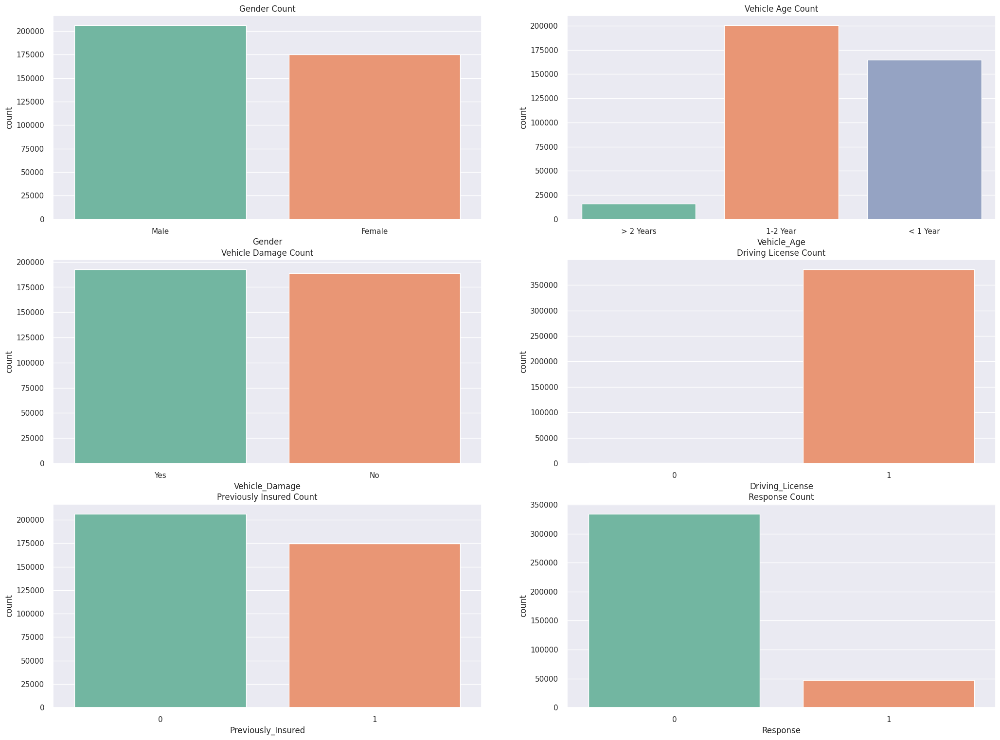

In [ ]:
# This code creates a figure with 3 rows and 2 columns to analyze the count of attributes
plt.figure(figsize = (25,25))

# First subplot: Count plot of Gender
plt.subplot(4,2,1)
plt.gca().set_title('Gender Count')
sns.countplot(x = 'Gender', palette = 'Set2', data = insurance_df)

# Second subplot: Count plot of Vehicle Age
plt.subplot(4,2,2)
plt.gca().set_title('Vehicle Age Count')
sns.countplot(x = 'Vehicle_Age', palette = 'Set2', data = insurance_df)

# Third subplot: Count plot of Vehicle Damage
plt.subplot(4,2,3)
plt.gca().set_title('Vehicle Damage Count')
sns.countplot(x = 'Vehicle_Damage', palette = 'Set2', data = insurance_df)

# Fourth subplot: Count plot of Driving License
plt.subplot(4,2,4)
plt.gca().set_title('Driving License Count')
sns.countplot(x = 'Driving_License', palette = 'Set2', data = insurance_df)

# Fifth subplot: Count plot of Previously Insured
plt.subplot(4,2,5)
plt.gca().set_title('Previously Insured Count')
sns.countplot(x = 'Previously_Insured', palette = 'Set2', data = insurance_df)

# Sixth subplot: Count plot of Response
plt.subplot(4,2,6)
plt.gca().set_title('Response Count')
sns.countplot(x = 'Response', palette = 'Set2', data = insurance_df)

**Observations**
- The data is well divided between male and female.
- If we see vehicle age then majority of the cars are new.
- Looking at the car damage we have practically the same values.
- In this  dataset everyone has a driving license.
- If we see previously insured or not then, not insured are more than insured ones.
- And looking at the target variable we can see that most of the customer would not like insurance.

In [ ]:
# Boxplot of Age
fig = px.box(insurance_df, x = 'Age')
fig.update_layout(title = 'Boxplot of Age', width = 600, height = 300)
fig.show()

There are no outliers present here.

In [ ]:
# Boxplot of Annual Premium
fig = px.box(insurance_df, x = 'Annual_Premium')
fig.update_layout(title = 'Boxplot of Annual Premium', width = 600, height = 400)
fig.show()

In Annual Premium there are outliers present.

In [ ]:
# Boxplot of Policy Sales Channel
fig = px.box(insurance_df, x = 'Policy_Sales_Channel')
fig.update_layout(title = 'Boxplot of Policy Sales Channel', width = 600, height = 400)
fig.show()

No outliers in the Policy Sales Channel.

In [ ]:
# Boxplot of Region Code
fig = px.box(insurance_df, x = 'Region_Code')
fig.update_layout(title = 'Boxplot of Region Code', width = 600, height = 400)
fig.show()

No outliers in Region Code.

In [ ]:
# Boxplot of Vintage
fig = px.box(insurance_df, x = 'Vintage')
fig.update_layout(title = 'Boxplot of Vintage', width = 600, height = 400)
fig.show()

No outliers in Vintage.

<Axes: title={'center': 'Response & Driving License'}, xlabel='Response', ylabel='count'>

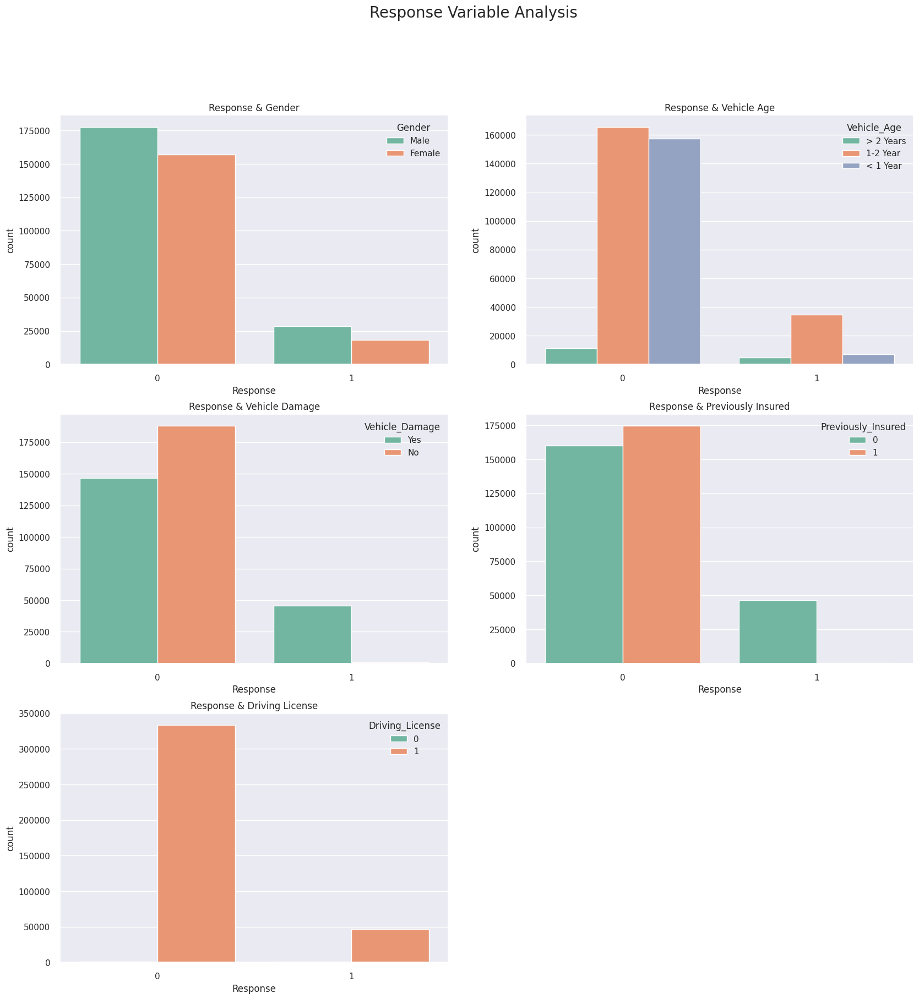

In [ ]:
# This code creates a figure with 5 rows and 2 columns to analyze the response variable

plt.figure(figsize = (20,20))
plt.suptitle('Response Variable Analysis', fontweight = 'light', fontsize = 20)

# First subplot: count plot of response variable by gender
plt.subplot(3,2,1)
plt.gca().set_title('Response & Gender')
sns.countplot(x = 'Response', hue = 'Gender', palette = 'Set2', data = insurance_df)

# Second subplot: count plot of response variable by vehicle age
plt.subplot(3,2,2)
plt.gca().set_title('Response & Vehicle Age')
sns.countplot(x = 'Response', hue = 'Vehicle_Age', palette = 'Set2', data = insurance_df)

# Third subplot: count plot of response variable by vehicle damage
plt.subplot(3,2,3)
plt.gca().set_title('Response & Vehicle Damage')
sns.countplot(x = 'Response', hue = 'Vehicle_Damage', palette = 'Set2', data = insurance_df)

# Fourth subplot: count plot of response variable by previous insurance
plt.subplot(3,2,4)
plt.gca().set_title('Response & Previously Insured')
sns.countplot(x = 'Response', hue = 'Previously_Insured', palette = 'Set2', data = insurance_df)

# Fifth subplot: count plot of response variable by driving license
plt.subplot(3,2,5)
plt.gca().set_title('Response & Driving License')
sns.countplot(x = 'Response', hue = 'Driving_License', palette = 'Set2', data = insurance_df)

**Observations**
- The distribution of Gender variable with the Response is almost same.
- Majority of the cars aged under 2 years didn't want the insurance. But if we compare we can see that cars aged 1-2 years are more likely to buy insurance.
- When we look at the car damage we observe that cars with no damage didn't want insurance and  practically all customers who are likely to want insurance are customers who have had problems with their car
- If we look at previously insured we find that customers who wanted insurance were not previously insured.
- Majority of people with driving license don't want insurance.

<Axes: xlabel='Vintage', ylabel='Density'>

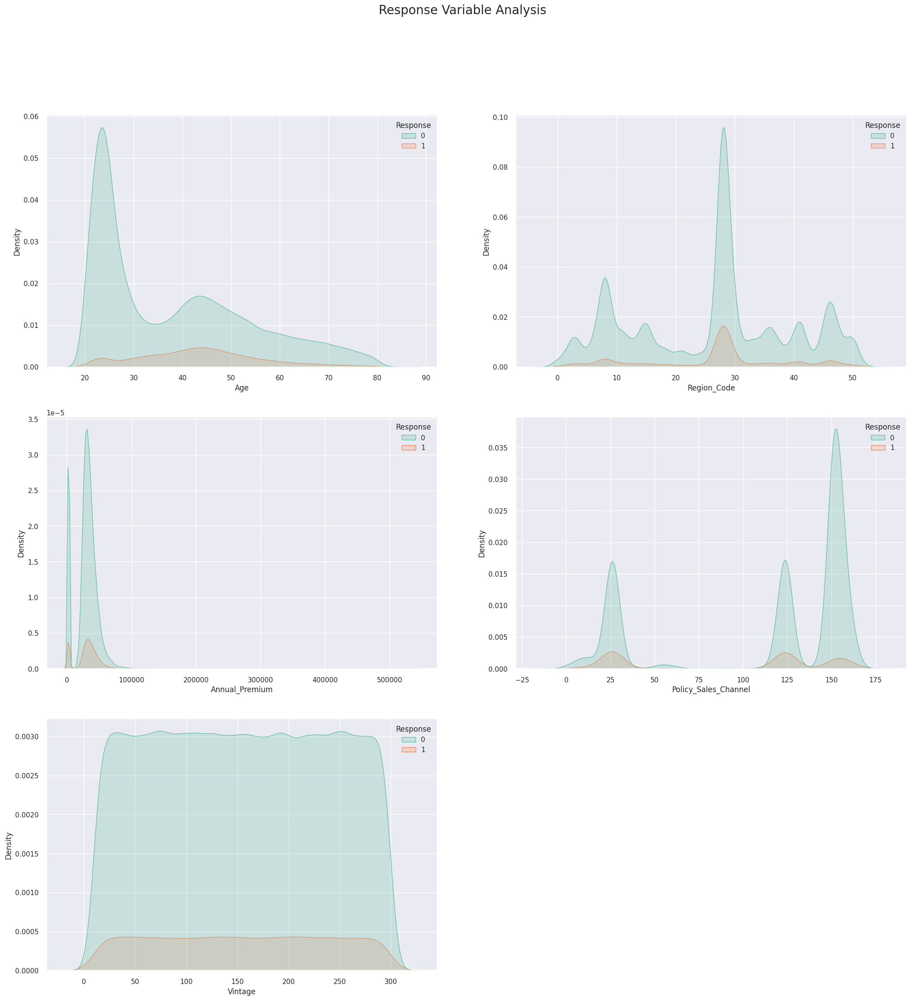

In [ ]:
# This code creates a figure with 3 rows and 2 columns to analyze the response variable using kernel density estimation (KDE) plots

plt.figure(figsize = (25,25))
plt.suptitle('Response Variable Analysis', fontweight = 'light', fontsize = 20)

# First subplot: KDE plot of response variable by age
plt.subplot(3,2,1)
sns.kdeplot(x = 'Age', hue = 'Response', palette = 'Set2', shade = True, data = insurance_df)

# Second subplot: KDE plot of response variable by region code
plt.subplot(3,2,2)
sns.kdeplot(x = 'Region_Code', hue = 'Response', palette = 'Set2', shade = True, data = insurance_df)

# Third subplot: KDE plot of response variable by annual premium
plt.subplot(3,2,3)
sns.kdeplot(x = 'Annual_Premium', hue = 'Response', palette = 'Set2', shade = True, data = insurance_df)

# Fourth subplot: KDE plot of response variable by policy sales channel
plt.subplot(3,2,4)
sns.kdeplot(x = 'Policy_Sales_Channel', hue = 'Response', palette = 'Set2', shade = True, data = insurance_df)

# Fifth subplot: KDE plot of response variable by vintage
plt.subplot(3,2,5)
sns.kdeplot(x = 'Vintage', hue = 'Response', palette = 'Set2', shade = True, data = insurance_df)

**Observations**
- Here, we can see that variables have almost the same distribution but if we look at age we can observe that with age a person is more likely to get an insurance.

<Axes: title={'center': 'Previously Insured & Driving License'}, xlabel='Previously_Insured', ylabel='count'>

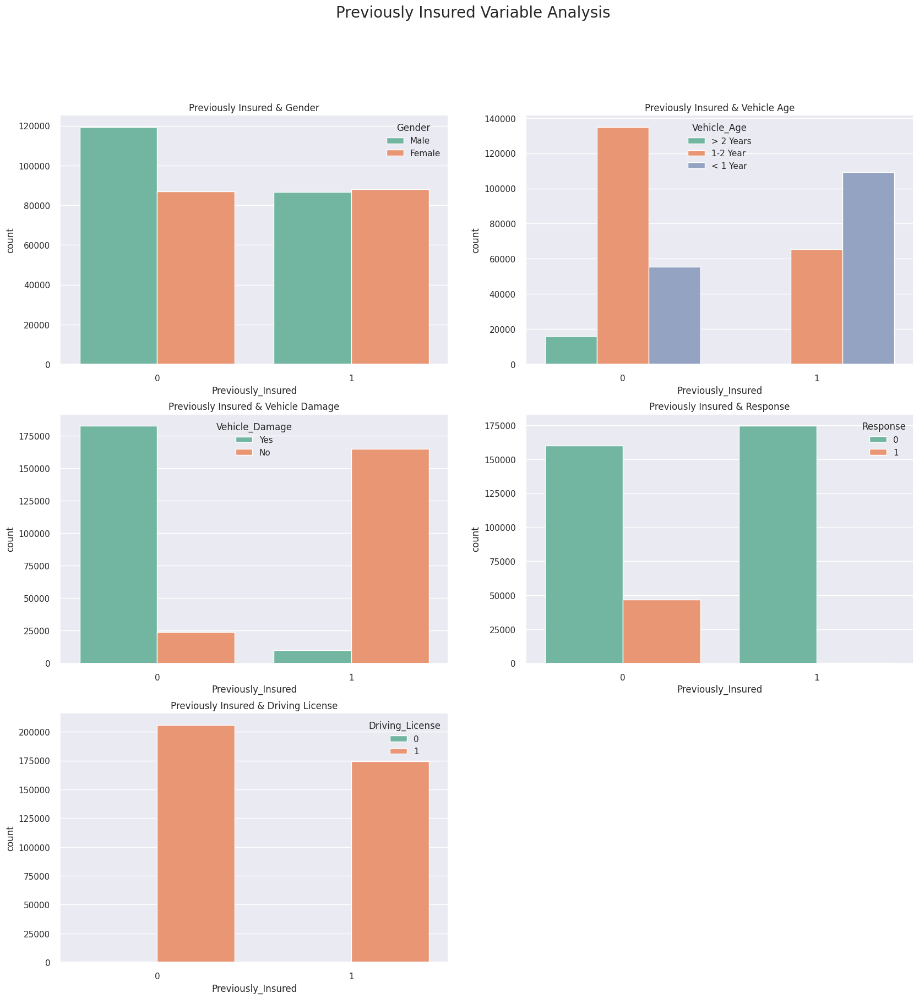

In [ ]:
# This code creates a figure with 5 rows and 2 columns to analyze the Previously_Insured variable

plt.figure(figsize = (20,20))
plt.suptitle('Previously Insured Variable Analysis', fontweight = 'light', fontsize = 20)

# First subplot: count plot of Previously_Insured variable by gender
plt.subplot(3,2,1)
plt.gca().set_title('Previously Insured & Gender')
sns.countplot(x = 'Previously_Insured', hue = 'Gender', palette = 'Set2', data = insurance_df)

# Second subplot: count plot of Previously_Insured variable by vehicle age
plt.subplot(3,2,2)
plt.gca().set_title('Previously Insured & Vehicle Age')
sns.countplot(x = 'Previously_Insured', hue = 'Vehicle_Age', palette = 'Set2', data = insurance_df)

# Third subplot: count plot of Previously_Insured variable by vehicle damage
plt.subplot(3,2,3)
plt.gca().set_title('Previously Insured & Vehicle Damage')
sns.countplot(x = 'Previously_Insured', hue = 'Vehicle_Damage', palette = 'Set2', data = insurance_df)

# Fourth subplot: count plot of Previously_Insured variable by Response
plt.subplot(3,2,4)
plt.gca().set_title('Previously Insured & Response')
sns.countplot(x = 'Previously_Insured', hue = 'Response', palette = 'Set2', data = insurance_df)

# Fifth subplot: count plot of Previously_Insured variable by driving license
plt.subplot(3,2,5)
plt.gca().set_title('Previously Insured & Driving License')
sns.countplot(x = 'Previously_Insured', hue = 'Driving_License', palette = 'Set2', data = insurance_df)

**Observations**
- Both male and female are equally distributed in terms of previously insured.
- vehicles more than 2 years of age are not previously insured at all.
- Almost all the previously insured vehicles were not damaged.
- All the customers who want insurance were not previously insured.
- More people with Driving license are not previously insured.

<Axes: xlabel='Vintage', ylabel='Density'>

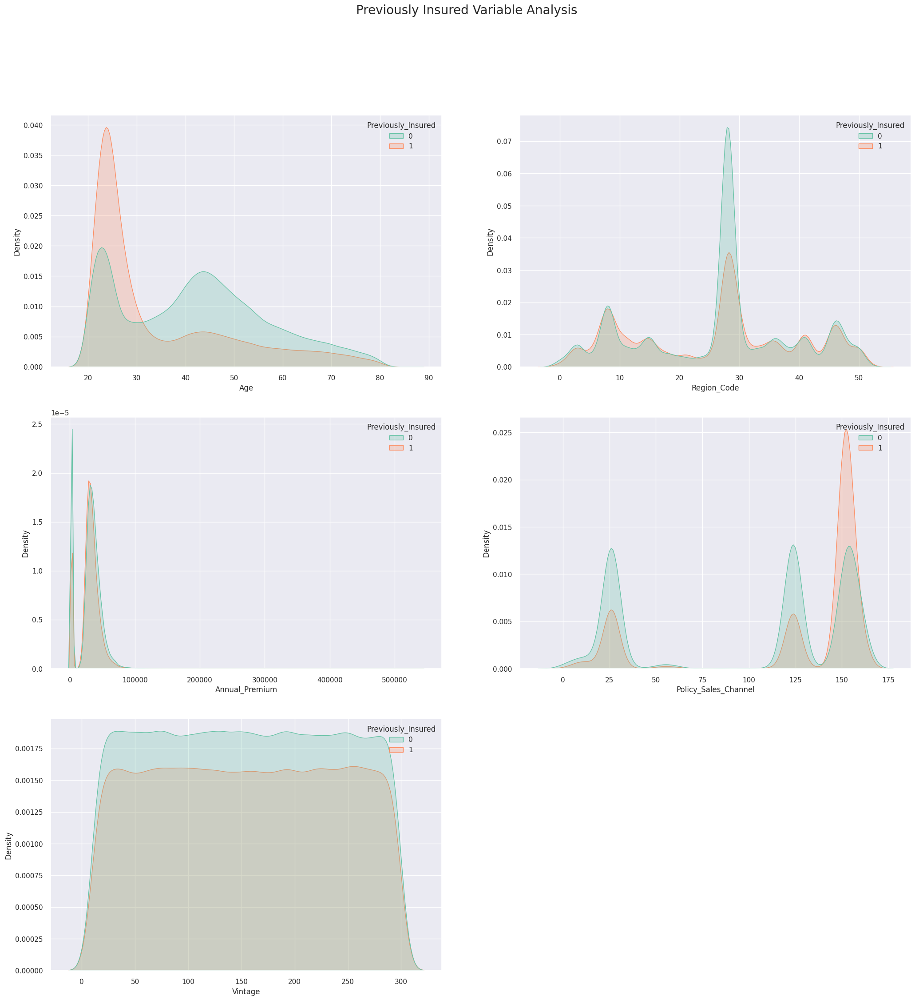

In [ ]:
# This code creates a figure with 3 rows and 2 columns to analyze the Previously_Insured variable using kernel density estimation (KDE) plots

plt.figure(figsize = (25,25))
plt.suptitle('Previously Insured Variable Analysis', fontweight = 'light', fontsize = 20)

# First subplot: KDE plot of Previously_Insured variable by age
plt.subplot(3,2,1)
sns.kdeplot(x = 'Age', hue = 'Previously_Insured', palette = 'Set2', shade = True, data = insurance_df)

# Second subplot: KDE plot of Previously_Insured variable by region code
plt.subplot(3,2,2)
sns.kdeplot(x = 'Region_Code', hue = 'Previously_Insured', palette = 'Set2', shade = True, data = insurance_df)

# Third subplot: KDE plot of Previously_Insured variable by annual premium
plt.subplot(3,2,3)
sns.kdeplot(x = 'Annual_Premium', hue = 'Previously_Insured', palette = 'Set2', shade = True, data = insurance_df)

# Fourth subplot: KDE plot of Previously_Insured variable by policy sales channel
plt.subplot(3,2,4)
sns.kdeplot(x = 'Policy_Sales_Channel', hue = 'Previously_Insured', palette = 'Set2', shade = True, data = insurance_df)

# Fifth subplot: KDE plot of Previously_Insured variable by vintage
plt.subplot(3,2,5)
sns.kdeplot(x = 'Vintage', hue = 'Previously_Insured', palette = 'Set2', shade = True, data = insurance_df)

**Observations**
- In Age we can see that a lot people in the age group of 20-30 years are previously insured, while there are two peaks for previously not insured customers one in the age group og 20-30 years while the other in the age group of 40-50 years.
- The rest of the distributions are almost same.

<Axes: title={'center': 'Vehicle_Damage & Driving License'}, xlabel='Vehicle_Damage', ylabel='count'>

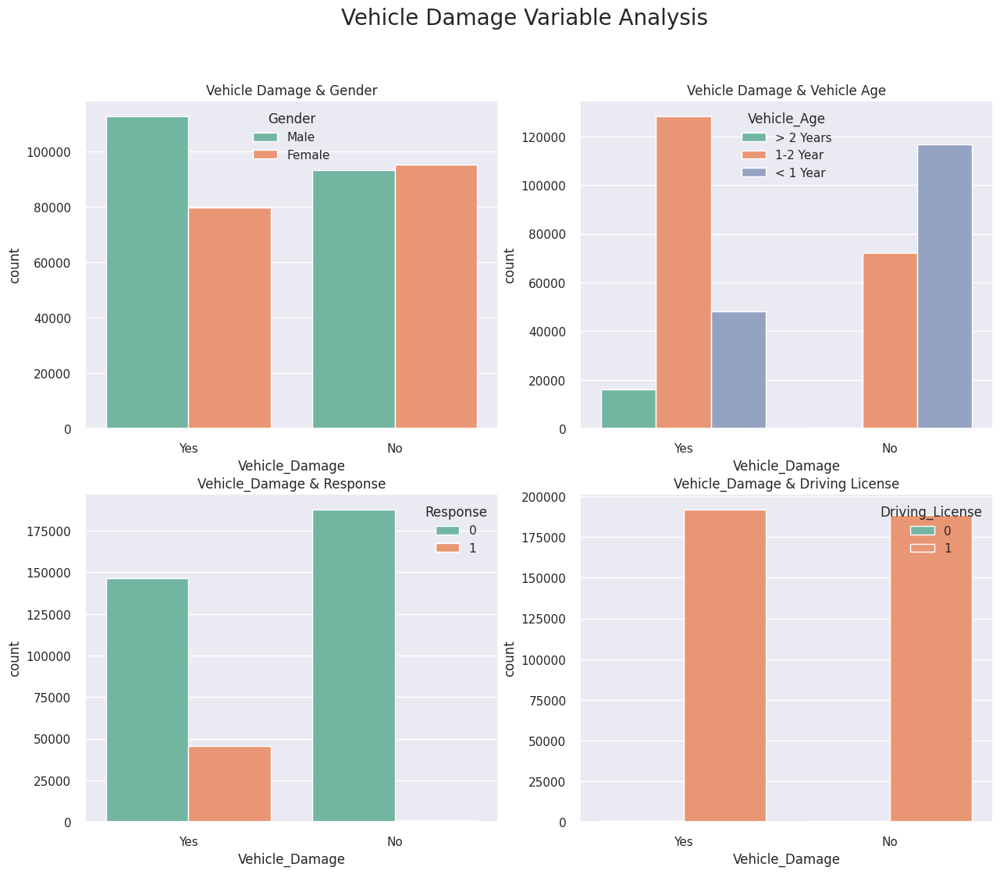

In [ ]:
# This code creates a figure with 5 rows and 2 columns to analyze the Vehicle Damage variable

plt.figure(figsize = (15,12))
plt.suptitle('Vehicle Damage Variable Analysis', fontweight = 'light', fontsize = 20)

# First subplot: count plot of vehicle_Damage variable by gender
plt.subplot(2,2,1)
plt.gca().set_title('Vehicle Damage & Gender')
sns.countplot(x = 'Vehicle_Damage', hue = 'Gender', palette = 'Set2', data = insurance_df)

# Second subplot: count plot of vehicle_Damage variable by vehicle age
plt.subplot(2,2,2)
plt.gca().set_title('Vehicle Damage & Vehicle Age')
sns.countplot(x = 'Vehicle_Damage', hue = 'Vehicle_Age', palette = 'Set2', data = insurance_df)

# Third subplot: count plot of Vehicle_Damage variable by Response
plt.subplot(2,2,3)
plt.gca().set_title('Vehicle_Damage & Response')
sns.countplot(x = 'Vehicle_Damage', hue = 'Response', palette = 'Set2', data = insurance_df)

# Fourth subplot: count plot of Vehicle_Damage variable by driving license
plt.subplot(2,2,4)
plt.gca().set_title('Vehicle_Damage & Driving License')
sns.countplot(x = 'Vehicle_Damage', hue = 'Driving_License', palette = 'Set2', data = insurance_df)

**Observations**
- We can see that for damaged vehicle the distribution is same for both Males
and Females.
- When we look at vehicle age we can observe that all the vehicles older than 2 years were damaged.
- On looking at the Response we find out that those who are interested in the insurance have damaged vehicles.
- In the case of driving license we can see that the distribution is same.

<Axes: xlabel='Vintage', ylabel='Density'>

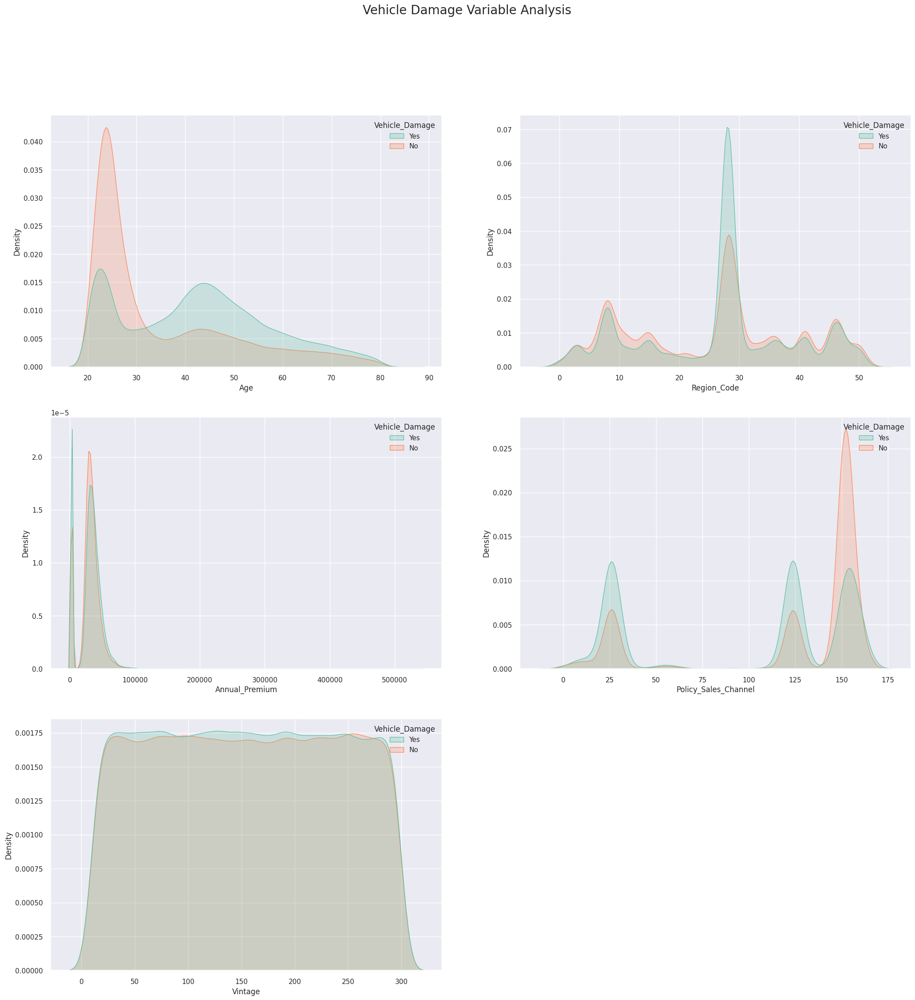

In [ ]:
# This code creates a figure with 3 rows and 2 columns to analyze the Vehicle Damage variable using kernel density estimation (KDE) plots

plt.figure(figsize = (25,25))
plt.suptitle('Vehicle Damage Variable Analysis', fontweight = 'light', fontsize = 20)

# First subplot: KDE plot of Vehicle_Damage variable by age
plt.subplot(3,2,1)
sns.kdeplot(x = 'Age', hue = 'Vehicle_Damage', palette = 'Set2', shade = True, data = insurance_df)

# Second subplot: KDE plot of Vehicle_Damage variable by region code
plt.subplot(3,2,2)
sns.kdeplot(x = 'Region_Code', hue = 'Vehicle_Damage', palette = 'Set2', shade = True, data = insurance_df)

# Third subplot: KDE plot of Vehicle_Damage variable by annual premium
plt.subplot(3,2,3)
sns.kdeplot(x = 'Annual_Premium', hue = 'Vehicle_Damage', palette = 'Set2', shade = True, data = insurance_df)

# Fourth subplot: KDE plot of Vehicle_Damage variable by policy sales channel
plt.subplot(3,2,4)
sns.kdeplot(x = 'Policy_Sales_Channel', hue = 'Vehicle_Damage', palette = 'Set2', shade = True, data = insurance_df)

# Fifth subplot: KDE plot of Vehicle_Damage variable by vintage
plt.subplot(3,2,5)
sns.kdeplot(x = 'Vintage', hue = 'Vehicle_Damage', palette = 'Set2', shade = True, data = insurance_df)

**Observations**
- Here, the distributions are pretty much the same but when we look at vehicle damage with age we can observe that a majority of young people did not have any vehicle damage while the damage is high for people in the age group of 40-50.

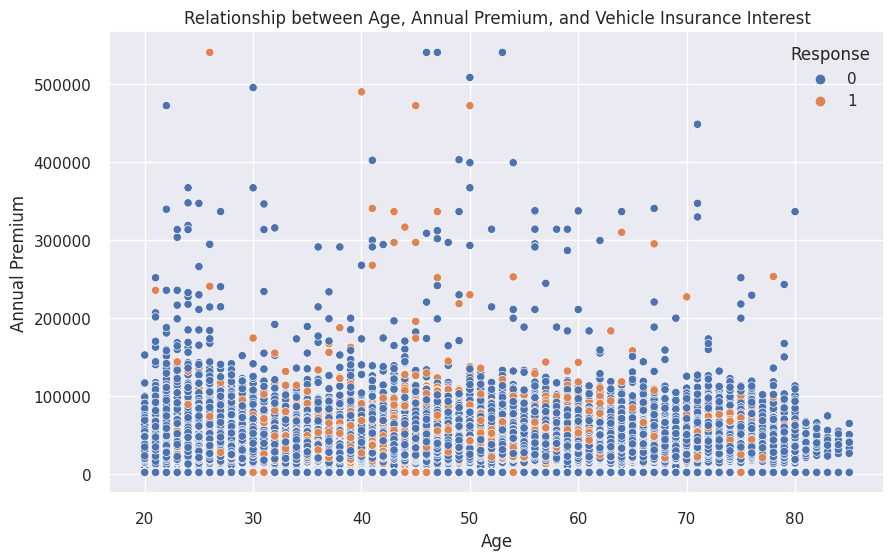

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='Annual_Premium', hue='Response', data=insurance_df)
plt.xlabel('Age')
plt.ylabel('Annual Premium')
plt.title('Relationship between Age, Annual Premium, and Vehicle Insurance Interest')
plt.show()


**Observations**
- From this  scatter plot there is no clear patter visible.

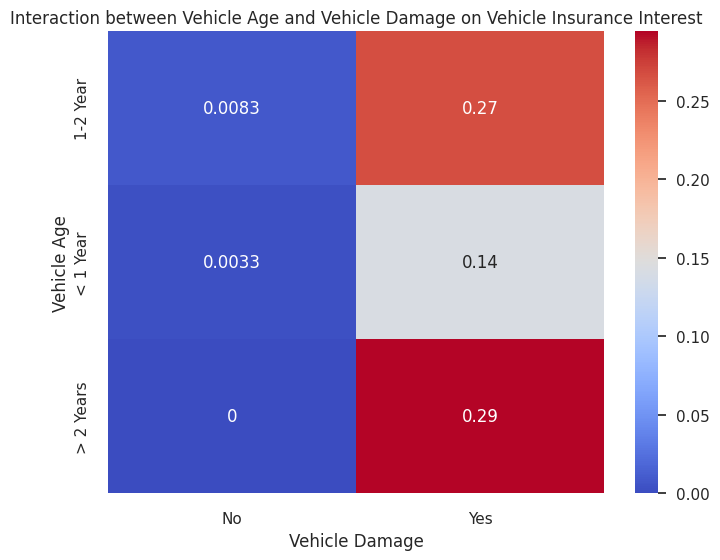

In [ ]:
cross_table = pd.crosstab(index = insurance_df['Vehicle_Age'], columns = insurance_df['Vehicle_Damage'], values = insurance_df['Response'], aggfunc = 'mean')
plt.figure(figsize=(8, 6))
sns.heatmap(cross_table, annot=True, cmap='coolwarm')
plt.xlabel('Vehicle Damage')
plt.ylabel('Vehicle Age')
plt.title('Interaction between Vehicle Age and Vehicle Damage on Vehicle Insurance Interest')
plt.show()


**Observations**
- 29% customers with vehicle damage and vehicle age > 2 years are interested in insurance.
- 27% of the customers with vehicle damage and vehicle age between 1-2 years are interested in insurance.

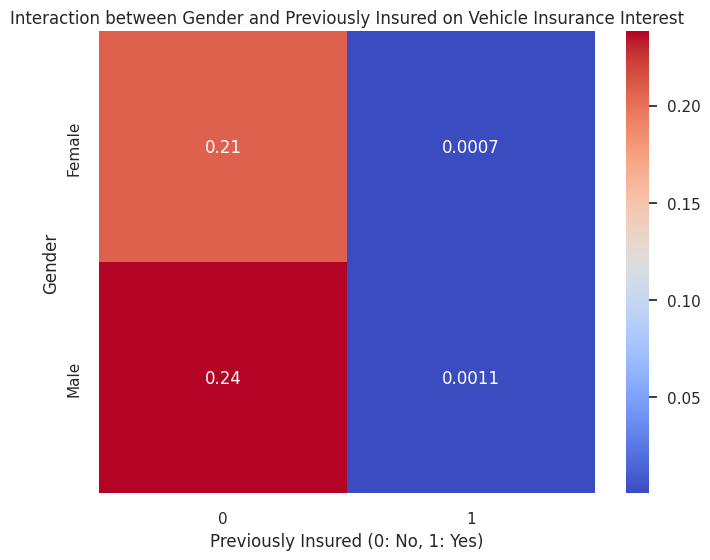

In [ ]:
cross_table = pd.crosstab(index = insurance_df['Gender'], columns = insurance_df['Previously_Insured'], values = insurance_df['Response'], aggfunc = 'mean')
plt.figure(figsize = (8, 6))
sns.heatmap(cross_table, annot = True, cmap = 'coolwarm')
plt.xlabel('Previously Insured (0: No, 1: Yes)')
plt.ylabel('Gender')
plt.title('Interaction between Gender and Previously Insured on Vehicle Insurance Interest')
plt.show()

**Observations**
- This tells us that on an average 21% females and 24% males with no previous insurance are interested in the insurance.


<Axes: >

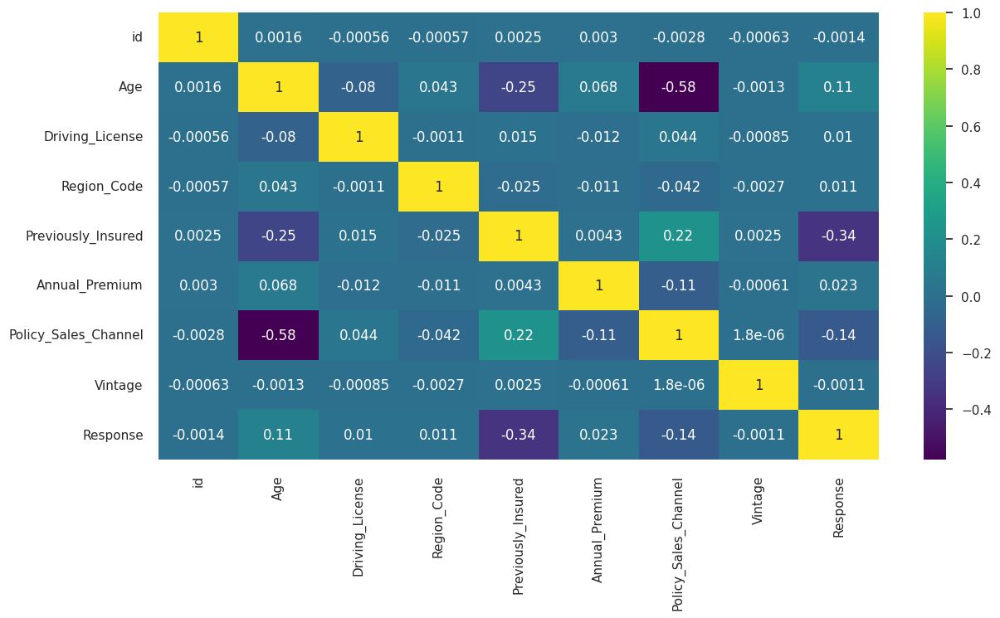

In [ ]:
plt.figure(figsize = (14,7))
corr = insurance_df.corr()
sns.heatmap(corr, annot = True, cmap = 'viridis')

**Observations**
- There are no strong correlation between the features.

#### Outliers

In [ ]:
num_cols = ['Age', 'Vintage','Annual_Premium','Region_Code','Policy_Sales_Channel']

In [ ]:
def outlier_threshold(column):
  Q1 = column.quantile(0.25)
  Q3 = column.quantile(0.75)
  IQR = Q3 - Q1
  lower_limit = Q1 - (1.5 * IQR)
  upper_limit = Q3 + (1.5 * IQR)

  return lower_limit, upper_limit

def check_outliers(dataframe, col_name):
    lower_limit, upper_limit = outlier_threshold(dataframe[col_name])
    if dataframe[(dataframe[col_name] > upper_limit) | (dataframe[col_name] < lower_limit)].any(axis=None):
        return True
    else:
        return False


In [ ]:
for col in num_cols:
  print(f"{col}:{check_outliers(insurance_df,col)}")

Age:False
Vintage:False
Annual_Premium:True
Region_Code:False
Policy_Sales_Channel:False


In [ ]:
def replace_outliers_with_limits(dataframe, col_name):
    lower_limit, upper_limit = outlier_threshold(dataframe[col_name])

    # Replace outliers below the lower limit with the lower limit
    dataframe[col_name] = dataframe[col_name].apply(lambda x: lower_limit if x < lower_limit else x)

    # Replace outliers above the upper limit with the upper limit
    dataframe[col_name] = dataframe[col_name].apply(lambda x: upper_limit if x > upper_limit else x)

    return dataframe

In [ ]:
for col in num_cols:
  replace_outliers_with_limits(insurance_df, col)

In [ ]:
for col in num_cols:
  print(f"{col}:{check_outliers(insurance_df,col)}")

Age:False
Vintage:False
Annual_Premium:False
Region_Code:False
Policy_Sales_Channel:False


In [ ]:
insurance_df = insurance_df.drop('id', axis = 1)

In [ ]:
X = insurance_df.drop('Response', axis = 1)
X = X.values
y = insurance_df['Response']

<Axes: xlabel='Response', ylabel='count'>

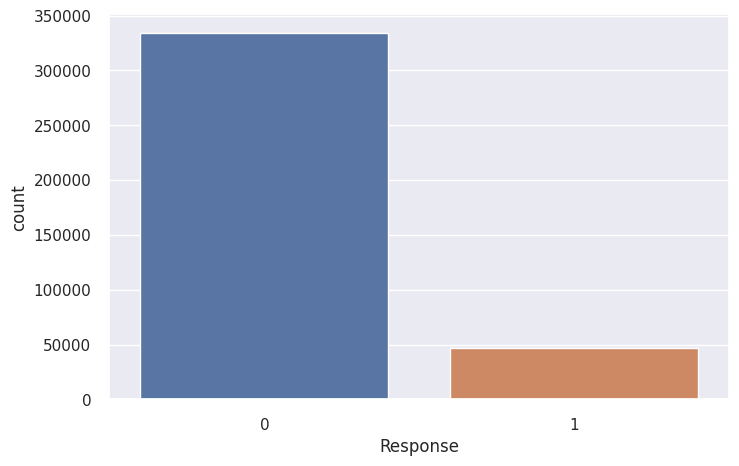

In [ ]:
plt.figure(figsize = (8,5))
sns.countplot(x = y, data = insurance_df)

**Observations**
- Here, we can see that there is imbalance in the data.

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Performing label encoding on categorical columns
label_encoder_gender = LabelEncoder()
label_encoder_Driving_License = LabelEncoder()
label_encoder_Previously_Insured = LabelEncoder()
label_encoder_Vehicle_Age = LabelEncoder()
label_encoder_Vehicle_Damage = LabelEncoder()

In [ ]:
X[:,0] = label_encoder_gender.fit_transform(X[:,0])
X[:,2] = label_encoder_Driving_License.fit_transform(X[:,2])
X[:,4] = label_encoder_Previously_Insured.fit_transform(X[:,4])
X[:,5] = label_encoder_Vehicle_Age.fit_transform(X[:,5])
X[:,6] = label_encoder_Vehicle_Damage.fit_transform(X[:,6])

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# Performing SMOTE oversampling to handle class imbalance
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 2)

In [ ]:
X_scaled,y = sm.fit_resample(X,y)

<Axes: xlabel='Response', ylabel='count'>

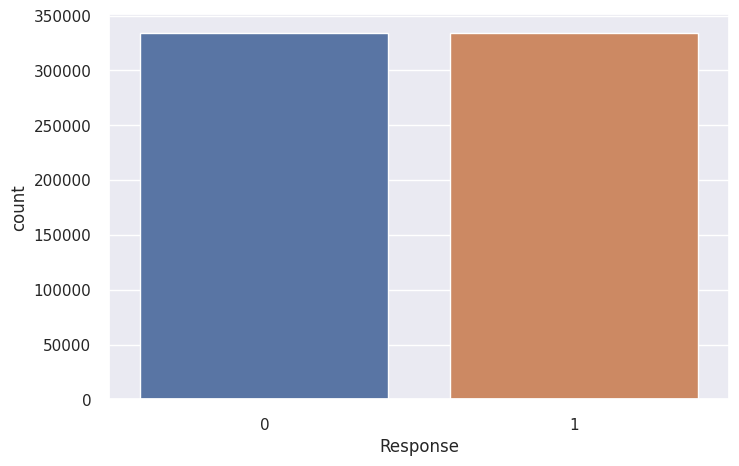

In [ ]:
plt.figure(figsize = (8,5))
sns.countplot(x = y)

Now, we can see that problem of class imbalance has been solved.

In [ ]:
y.value_counts()

1    334399
0    334399
Name: Response, dtype: int64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.3, random_state = 0)
print('X_train shape:',X_train.shape)
print('X_test shape:',X_test.shape)

X_train shape: (468158, 10)
X_test shape: (200640, 10)


### Model Building

#### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
logistic = LogisticRegression(fit_intercept = True, random_state = 0, max_iter = 1000)

In [ ]:
logistic.fit(X_train,y_train)

LogisticRegression(max_iter=1000, random_state=0)

In [ ]:
# Get the predicted probabilities
train_preds = logistic.predict_proba(X_train)
test_preds = logistic.predict_proba(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns

In [ ]:
# Get the predicted classes
train_class_preds = logistic.predict(X_train)
test_class_preds = logistic.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_class_preds,y_train)
test_accuracy = accuracy_score(test_class_preds,y_test)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.7792775088752087
The accuracy on test data is  0.7790271132376395


0.7790271132376395

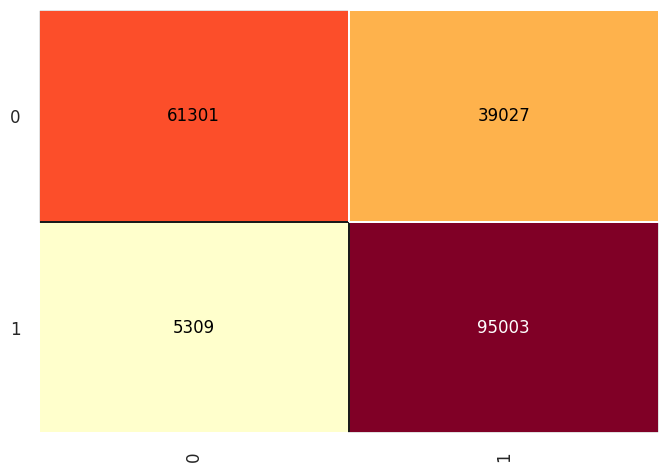

In [ ]:
cm = ConfusionMatrix(logistic)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

In [ ]:
logistic_normal = (classification_report(y_test, test_class_preds))

In [ ]:
print(logistic_normal)

              precision    recall  f1-score   support

           0       0.92      0.61      0.73    100328
           1       0.71      0.95      0.81    100312

    accuracy                           0.78    200640
   macro avg       0.81      0.78      0.77    200640
weighted avg       0.81      0.78      0.77    200640



In [ ]:
score_logistic = 0.7790271132376395

**Observations**
- This model performs reasonably well in classifying customers as interested or not interested in Vehicle Insurance.
- It excels in terms of recall for class 1, which is important when minimizing false negatives is a priority (e.g., identifying potential customers).
- However, there is room for improvement in precision for class 1, as it has a relatively higher rate of false positives.

#### Decision Tree

In [ ]:
# Define the hyperparameter grid
min_split = np.array([2, 3, 4, 5, 6, 7])
max_nvl = np.array([3, 4, 5, 6, 7, 9, 11])
alg = ['entropy', 'gini']
values_grid = {'min_samples_split': min_split, 'max_depth': max_nvl, 'criterion': alg}

In [ ]:
# Instantiate the decision tree classifier
model = DecisionTreeClassifier()

In [ ]:
# Instantiate the GridSearchCV object
decisiontree_gscv = GridSearchCV(estimator = model, param_grid = values_grid, cv = 5)

In [ ]:
# Fit the model to the training data
decisiontree_gscv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  9, 11]),
                         'min_samples_split': array([2, 3, 4, 5, 6, 7])})

In [ ]:
print('Min Split: ', decisiontree_gscv.best_estimator_.min_samples_split)
print('Max Nvl: ', decisiontree_gscv.best_estimator_.max_depth)
print('Algorithm: ', decisiontree_gscv.best_estimator_.criterion)
print('Score: ', decisiontree_gscv.best_score_)

Min Split:  7
Max Nvl:  11
Algorithm:  gini
Score:  0.8625656301052956


In [ ]:
decision_tree = DecisionTreeClassifier(criterion = 'gini', min_samples_split = 7, max_depth = 11, random_state = 0)

In [ ]:
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=11, min_samples_split=7, random_state=0)

In [ ]:
test_pred_dt = decision_tree.predict(X_test)

0.8629784688995216

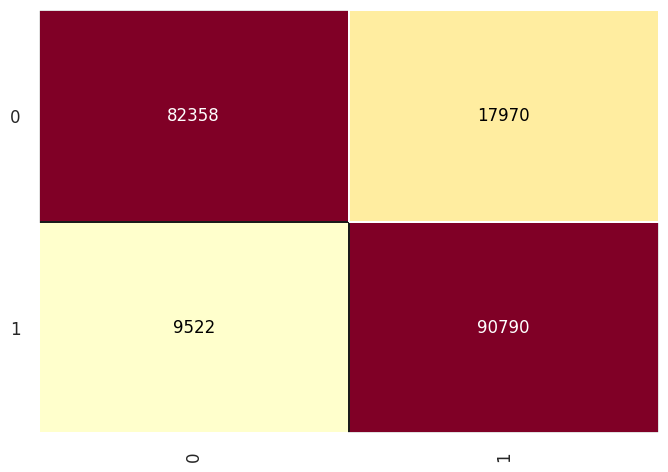

In [ ]:
cm = ConfusionMatrix(decision_tree)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

In [ ]:
classificationreport_dt = (classification_report(y_test, test_pred_dt))
print(classificationreport_dt)

              precision    recall  f1-score   support

           0       0.90      0.82      0.86    100328
           1       0.83      0.91      0.87    100312

    accuracy                           0.86    200640
   macro avg       0.87      0.86      0.86    200640
weighted avg       0.87      0.86      0.86    200640



In [ ]:
score_decisiontree = 0.8629784688995216

In [ ]:
columns = insurance_df.drop('Response', axis = 1).columns

In [ ]:
feature_imp = pd.Series(decision_tree.feature_importances_, index = columns).sort_values(ascending = False)

In [ ]:
feature_imp

Vehicle_Damage          0.596994
Gender                  0.139106
Age                     0.112013
Vehicle_Age             0.082309
Region_Code             0.027218
Previously_Insured      0.024922
Policy_Sales_Channel    0.015353
Annual_Premium          0.001234
Vintage                 0.000850
Driving_License         0.000000
dtype: float64

**Observations**
 - The Decision Tree model shows good overall performance in classifying customers as interested or not interested in Vehicle Insurance.
 - It achieves high precision and recall for both classes, resulting in balanced F1-scores.
 - The accuracy of 0.86 indicates that the model's predictions align well with the true labels.

#### Random Forest

In [ ]:
n_estimators = np.array([100])
alg = ['entropy', 'gini']
values_grid = {'n_estimators': n_estimators, 'criterion': alg}

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

In [ ]:
randomforest_gscv = GridSearchCV(estimator = model, param_grid = values_grid, cv = 5)

In [ ]:
randomforest_gscv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'n_estimators': array([100])})

In [ ]:
print("Algorithm: ",randomforest_gscv.best_estimator_.criterion)
print("Score: ",randomforest_gscv.best_score_)

Algorithm:  entropy
Score:  0.9137705625965742


In [ ]:
random_forest = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)

In [ ]:
random_forest.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', random_state=0)

In [ ]:
test_pred_rf = random_forest.predict(X_test)

0.9159489633173844

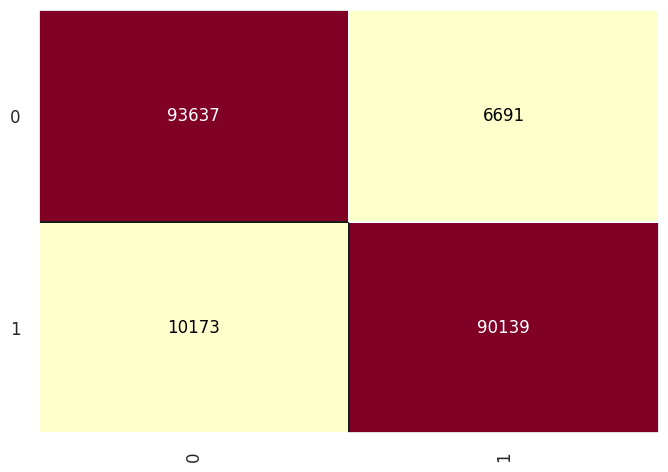

In [ ]:
cm = ConfusionMatrix(random_forest)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

In [ ]:
classification_random = (classification_report(y_test, test_pred_rf))

In [ ]:
print(classification_random)

              precision    recall  f1-score   support

           0       0.90      0.93      0.92    100328
           1       0.93      0.90      0.91    100312

    accuracy                           0.92    200640
   macro avg       0.92      0.92      0.92    200640
weighted avg       0.92      0.92      0.92    200640



In [ ]:
score_random = 0.9159489633173844

In [ ]:
feature_imp_random = pd.Series(random_forest.feature_importances_, index = columns).sort_values(ascending = False)

In [ ]:
feature_imp_random

Vehicle_Damage          0.192399
Age                     0.148855
Previously_Insured      0.137977
Gender                  0.109838
Vintage                 0.103608
Annual_Premium          0.087925
Vehicle_Age             0.079498
Region_Code             0.075992
Policy_Sales_Channel    0.063268
Driving_License         0.000639
dtype: float64

**Observations**
- This model performs very well in classifying customers as interested or not interested in Vehicle Insurance.
- It achieves high precision and recall for both classes, resulting in balanced F1-scores.
- The accuracy of 0.92 indicates that the model's predictions align very well with the true labels, and it is a strong performer for this classification task.

#### Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
naive_bayes = GaussianNB()
naive_bayes.fit(X_train,y_train)

GaussianNB()

In [ ]:
test_pred_naive = naive_bayes.predict(X_test)

0.7973185805422648

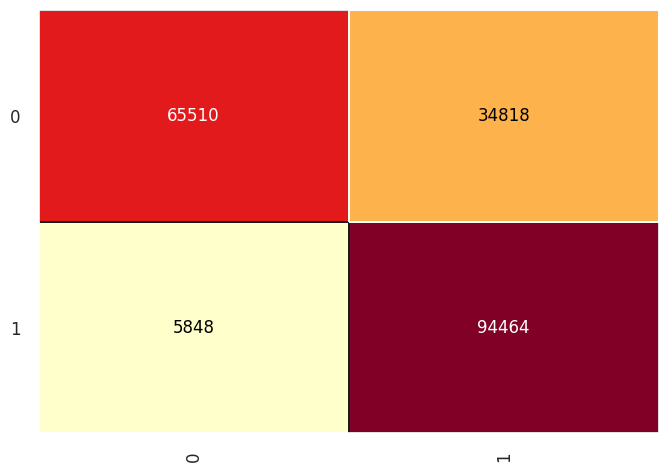

In [ ]:
cm = ConfusionMatrix(naive_bayes)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

In [ ]:
classification_naive_gaussian = (classification_report(y_test, test_pred_naive))

In [ ]:
print(classification_naive_gaussian)

              precision    recall  f1-score   support

           0       0.92      0.65      0.76    100328
           1       0.73      0.94      0.82    100312

    accuracy                           0.80    200640
   macro avg       0.82      0.80      0.79    200640
weighted avg       0.82      0.80      0.79    200640



In [ ]:
score_naive_gaussian = 0.7973185805422648

**Observation**
- The model performs reasonably well in classifying customers as interested or not interested in Vehicle Insurance.
- It excels in terms of recall for class 1, which is important when minimizing false negatives is a priority (e.g., identifying potential customers).
- However, there is room for improvement in precision for class 1, as it has a relatively higher rate of false positives.

#### K Means

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
model = KMeans(n_clusters = 2, random_state = 42)

In [ ]:
model.fit(X_train)

KMeans(n_clusters=2, random_state=42)

In [ ]:
test_pred_kmeans = model.predict(X_test)

In [ ]:
classification_kmeans_standard = (accuracy_score(y_test, test_pred_kmeans))

In [ ]:
classification_kmeans_standard

0.5038227671451355

In [ ]:
score_kmeans = 0.5038227671451355

**Observations**
- Not a good model. It has got the least score till now.

#### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier()

In [ ]:
k_list = list(range(1,10))
k_values = dict(n_neighbors = k_list)

In [ ]:
knn_gscv = GridSearchCV(knn, k_values, cv = 2, scoring = 'accuracy', n_jobs = -1)

In [ ]:
knn_gscv.fit(X_train,y_train)

GridSearchCV(cv=2, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9]},
             scoring='accuracy')

In [ ]:
knn_gscv.best_params_, knn_gscv.best_score_

({'n_neighbors': 1}, 0.8135992549523878)

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 1, metric = 'minkowski', p = 2)

In [ ]:
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
test_pred_knn = knn.predict(X_test)

0.8625448564593301

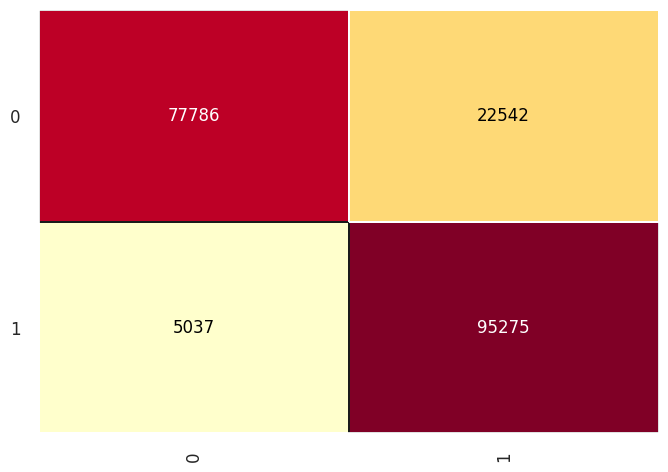

In [ ]:
cm = ConfusionMatrix(knn)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

In [ ]:
classification_knn = (classification_report(y_test, test_pred_knn))
print(classification_knn)

              precision    recall  f1-score   support

           0       0.94      0.78      0.85    100328
           1       0.81      0.95      0.87    100312

    accuracy                           0.86    200640
   macro avg       0.87      0.86      0.86    200640
weighted avg       0.87      0.86      0.86    200640



In [ ]:
score_knn = 0.8625448564593301

**Observations**
- This model performs well in classifying customers as interested or not interested in Vehicle Insurance.
- It achieves high precision and recall for both classes, resulting in balanced F1-scores.
- The accuracy of 0.86 indicates that the model's predictions align well with the true labels, and it is a strong performer for this classification task.

#### Chi Square

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

features = X_scaled
target = y

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(columns),columns = ['Chi Squared Score'])

In [ ]:
featureScores.sort_values(by = 'Chi Squared Score', ascending = False).round(3)

,Chi Squared Score
Annual_Premium,5819141.413
Policy_Sales_Channel,876993.098
Previously_Insured,171208.461
Age,109642.567
Vehicle_Damage,68899.211
Vehicle_Age,13633.516
Region_Code,1918.728
Gender,1802.449
Vintage,90.072
Driving_License,0.362


- Chi-Squared scores provide valuable insights into the importance of each feature in predicting customer interest in Vehicle Insurance.
- Features like Annual Premium, Policy Sales Channel, Previously Insured, Age, and Vehicle Damage appear to be particularly influential in making predictions, while Driving License and Vintage have less impact.

In [ ]:
feature_imp  # Decison Tree

Vehicle_Damage          0.596994
Gender                  0.139106
Age                     0.112013
Vehicle_Age             0.082309
Region_Code             0.027218
Previously_Insured      0.024922
Policy_Sales_Channel    0.015353
Annual_Premium          0.001234
Vintage                 0.000850
Driving_License         0.000000
dtype: float64

In [ ]:
feature_imp_random # Random Forest

Vehicle_Damage          0.192399
Age                     0.148855
Previously_Insured      0.137977
Gender                  0.109838
Vintage                 0.103608
Annual_Premium          0.087925
Vehicle_Age             0.079498
Region_Code             0.075992
Policy_Sales_Channel    0.063268
Driving_License         0.000639
dtype: float64

#### Results

In [ ]:
import pandas as pd

# Defining the classification reports as dictionaries
classification_reports = {
    "Logistic Regression": {
        "Precision (0)": 0.96,
        "Precision (1)": 0.71,
        "Recall (0)": 0.59,
        "Recall (1)": 0.98,
        "F1-Score (0)": 0.73,
        "F1-Score (1)": 0.82,
        "Accuracy": 0.78
    },
    "Decision Tree": {
        "Precision (0)": 0.92,
        "Precision (1)": 0.73,
        "Recall (0)": 0.64,
        "Recall (1)": 0.95,
        "F1-Score (0)": 0.76,
        "F1-Score (1)": 0.82,
        "Accuracy": 0.79
    },
    "Random Forest": {
        "Precision (0)": 0.90,
        "Precision (1)": 0.93,
        "Recall (0)": 0.93,
        "Recall (1)": 0.90,
        "F1-Score (0)": 0.92,
        "F1-Score (1)": 0.91,
        "Accuracy": 0.92
    },
    "K-Nearest Neighbors": {
        "Precision (0)": 0.92,
        "Precision (1)": 0.73,
        "Recall (0)": 0.65,
        "Recall (1)": 0.94,
        "F1-Score (0)": 0.76,
        "F1-Score (1)": 0.82,
        "Accuracy": 0.80
    },
    "Gaussian Naive Bayes": {
        "Precision (0)": 0.92,
        "Precision (1)": 0.71,
        "Recall (0)": 0.61,
        "Recall (1)": 0.95,
        "F1-Score (0)": 0.73,
        "F1-Score (1)": 0.81,
        "Accuracy": 0.78
    }
}

# Creating a DataFrame from the classification reports
classification_df = pd.DataFrame(classification_reports).T

# Display the DataFrame
classification_df


,Precision (0),Precision (1),Recall (0),Recall (1),F1-Score (0),F1-Score (1),Accuracy
Logistic Regression,0.96,0.71,0.59,0.98,0.73,0.82,0.78
Decision Tree,0.92,0.73,0.64,0.95,0.76,0.82,0.79
Random Forest,0.90,0.93,0.93,0.90,0.92,0.91,0.92
K-Nearest Neighbors,0.92,0.73,0.65,0.94,0.76,0.82,0.80
Gaussian Naive Bayes,0.92,0.71,0.61,0.95,0.73,0.81,0.78


## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

In this project, we have extensively analyzed customer data to predict their interest in purchasing vehicle insurance. Here are the key conclusions and recommendations:

**1. Model Performance:**
   - We trained and evaluated several machine learning models, including Logistic Regression, Decision Tree, Random Forest, K-Nearest Neighbors, and Gaussian Naive Bayes.
   - Among these models, Random Forest emerged as the top performer, achieving the highest accuracy, precision, recall, and F1-score.
   - Logistic Regression and Decision Tree models also showed reasonably good performance.
   - K-Nearest Neighbors and Gaussian Naive Bayes exhibited slightly lower performance.

**2. Key Predictive Features:**
   - Features such as Annual Premium, Policy Sales Channel, Previously Insured, Age, and Vehicle Damage were identified as significant predictors of customer interest in vehicle insurance.
   - These features played a crucial role in the predictive power of the models.

**3. Gender Influence:**
   - We observed that gender had a relatively minor influence on customer interest in vehicle insurance, with both males and females showing similar patterns.

**4. Business Implications:**
   - The insights gained from this analysis can help the insurance company optimize its business strategies.
   - The Random Forest model, being the top performer, can be deployed to target potential customers more effectively and efficiently.
   - Tailored marketing and communication strategies can be developed based on the identified key features, ensuring a higher likelihood of success.

**5. Future Considerations:**
   - To further enhance the predictive power of the model, more granular data collection and feature engineering can be explored.
   - Continuous monitoring of model performance and regular updates will be essential to adapt to changing customer behaviors.
   - The company can consider implementing a customer segmentation strategy based on the insights derived from this analysis.


**6. Customer Engagement Strategy:**
   - Based on the model predictions, the company can tailor its customer engagement strategy to target individuals who are more likely to be interested in vehicle insurance.
   - This targeted approach can lead to improved conversion rates and increased revenue for the insurance company.

In conclusion, this project has provided valuable insights into customer behavior and preferences regarding vehicle insurance. By leveraging machine learning models, the insurance company can enhance its decision-making processes, optimize marketing efforts, and ultimately achieve better business outcomes. Continuous monitoring and adaptation to changing market dynamics will be crucial for long-term success in the competitive insurance industry.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***